# Исследование рынка общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

<b>Цель исследования:</b> Подготовить исследование ресторанов общественного питания Москвы, изучить особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

<b>Ход исследования</b>

Данные о заведениях общественного питания Москвы мы получим из файла moscow_places.csv, в нем хранится информация о названиях заведений, их адресах, категориях, времени работы и прочая информация, необходимая для исследования.

Сначала проверим данные на ошибки и оценим их влияние на исследование. Затем, на этапе предобработки данных попробуем найти возможность исправить все ошибки данных, которые не приведут к искажение конечного результата. Далее проведем исследование рынка общественных заведений Москвы и попробуем найти условия, которые напрямую влияют на успешность заведений. После чего соберем результаты анализа в общий вывод с рекомендациями, на которые стоит опираться при выборе места для открытия заведения общественного питания в Москве.

## Общая информация о данных

In [1]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

In [2]:
places = pd.read_csv('moscow_places.csv')

In [3]:
places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
print(places['name'].nunique())
places['name'].value_counts().head(20)

5614


Кафе                                   189
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
Шаурма                                  43
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Ресторан                                34
CofeFest                                32
Буханка                                 32
Столовая                                28
Му-Му                                   27
Drive Café                              24
Name: name, dtype: int64

На первый взгляд в датасете, состоящем из 8406 строк и 14 столбцов, видно большое количество пропусков в некоторых из столбцов. Также можно заметить, что в столбце с именами присутствуют не только уникальные названия заведений, но строки, относящиеся к категориям заведений(например Кафе, Шаурма, Ресторан и др.)

## Предобработка данных

In [6]:
print(places.duplicated().sum())
places['name'] = places['name'].str.lower()
places['address'] = places['address'].str.lower()
print(places[['name', 'address']].duplicated().sum())
places = places[~places[['name', 'address']].duplicated()]

0
4


В датасете присутствуют заведения 4 заведения с одинаковыми названиями и адресами, что можно отнести к неявным дубликатам. Эти строки были удалены.

In [7]:
places.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


В 6 из 14 столбцов присутствуют пропуски, а именно в hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. В 2 из 6 столбцов hours и seats содержится персональная информация для каждого из заведений, и поскольку пропусков в обоих из столбцов на много больше 5%, избавиться от строк с пропусками в них мы не можем, равно как и заполнить значения средними/медианами.

С оставшимися столбцами price, avg_bill, middle_avg_bill, middle_coffee_cup ситуация иная: в них хранится информация о ценах в заведениях и может быть заполнима медианными значениями, однако из за того, что в в этих столбцах число пропусков более 50%, восстановление медианами не возможно, поскольку это может крайне негативно отразиться на дальнейших результатах исследования.

1.0
5.0


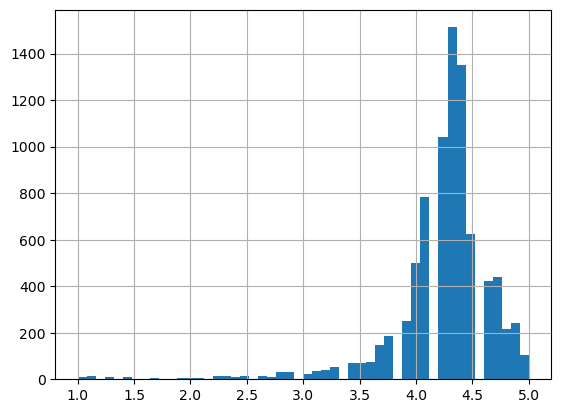

In [8]:
print(places['rating'].min())
print(places['rating'].max())
places['rating'].hist(bins=50)
plt.show()

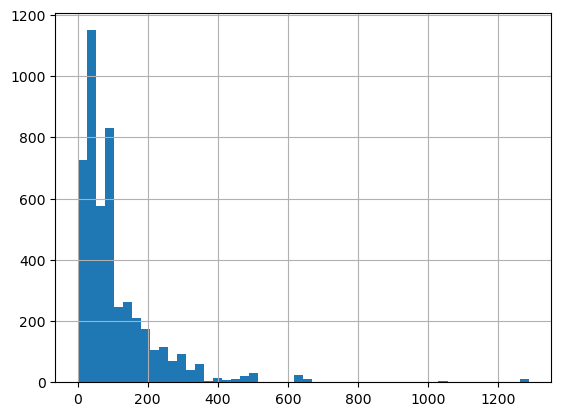

In [9]:
places['seats'].hist(bins=50)
plt.show()

В столбце с количеством посадочных мест в заведениях присутствуют аномалии c числами более 200 мест.

35000.0
0.0


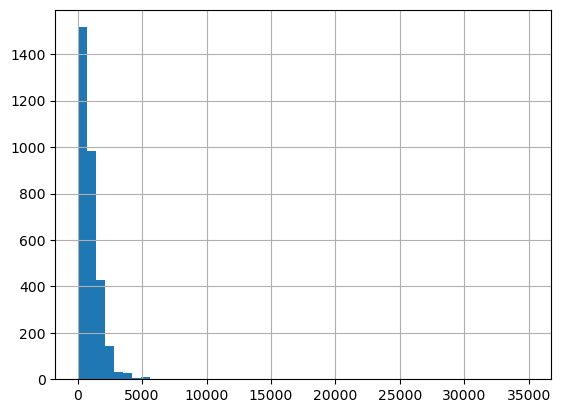

In [10]:
print(places['middle_avg_bill'].max())
print(places['middle_avg_bill'].min())
places['middle_avg_bill'].hist(bins=50)
plt.show()

In [11]:
places.loc[places['middle_avg_bill']==0, 'middle_avg_bill'] = np.nan

В столбце со средним чеком есть была строка с нулевым значением, что скорее всего является ошибкой. Значение в ней было удалено. Также можно заметить , что присутствует заведение со средним чеком 35тысяч рублей, что вполне может соответствовать действительности.

1568.0
60.0


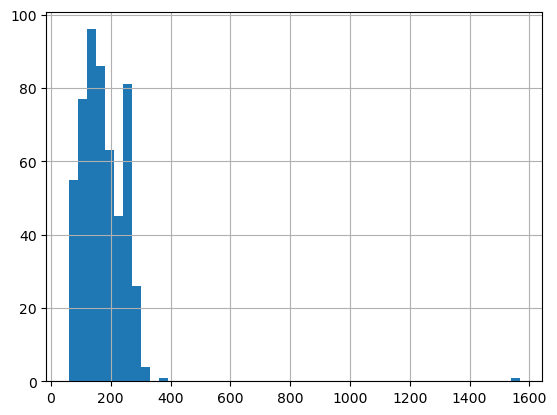

In [12]:
print(places['middle_coffee_cup'].max())
print(places['middle_coffee_cup'].min())
places['middle_coffee_cup'].hist(bins=50)
plt.show()

В столбце со средней ценой кофе аномалий не обнаружено.

In [13]:
places['address'].unique()[:50]

array(['москва, улица дыбенко, 7/1', 'москва, улица дыбенко, 36, корп. 1',
       'москва, клязьминская улица, 15',
       'москва, улица маршала федоренко, 12',
       'москва, правобережная улица, 1б', 'москва, ижорская улица, вл8б',
       'москва, клязьминская улица, 9, стр. 3',
       'москва, дмитровское шоссе, 107, корп. 4',
       'москва, ангарская улица, 39', 'москва, левобережная улица, 12',
       'москва, улица маршала федоренко, 10с1',
       'москва, мкад, 80-й километр, 1',
       'москва, базовская улица, 15, корп. 1',
       'москва, ангарская улица, 42с1',
       'москва, улица бусиновская горка, 2',
       'москва, базовская улица, 15, корп. 8',
       'москва, ленинградское шоссе, 71б, стр. 2',
       'москва, коровинское шоссе, 30а', 'москва, ижорский проезд, 5',
       'москва, прибрежный проезд, 7',
       'москва, коровинское шоссе, 35, стр. 17',
       'москва, лобненская улица, 13к2', 'москва, улица дыбенко, 9ас1',
       'москва, парк левобережный', 'москва,

In [14]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия', 'парк', 'МКАД']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

places['street'] = places['address'].str.extract(str_pat, flags=re.I)

In [15]:
places.loc[places['street'].isna(), 'address'].head(10)

25                             москва, парк левобережный
60             москва, ландшафтный заказник лианозовский
64           москва, лианозовский парк культуры и отдыха
73                                москва, парк алтуфьево
137                         москва, парк ангарские пруды
157                  москва, проектируемый проезд № 5265
189                         москва, парк ангарские пруды
267        москва, парк этнографическая деревня бибирево
316    москва, северный административный округ, голов...
331    москва, северный административный округ, голов...
Name: address, dtype: object

In [16]:
places['is_24/7'] = places['hours'] == 'ежедневно, круглосуточно'

Предобработка данных успешно завершена. Неявные дубликаты выявлены и успешно удалены. Причину появления пропусков в данных выявить не возможно также, как и обработать эти пропуски, поэтому принято решение оставить строки нетронутыми. Все явные аномалии в данных были обработаны. Добавлены столбцы с информацией о улице, на которой находится заведение, и с информацией о круглосуточных заведениях.

## Анализ данных

In [17]:
category_grouped = places.groupby('category', as_index=False)['name'].count().sort_values(by='name')
category_grouped.columns = ['category', 'count']
category_grouped

,category,count
1,булочная,256
7,столовая,315
2,быстрое питание,603
5,пиццерия,633
0,"бар,паб",764
4,кофейня,1413
6,ресторан,2042
3,кафе,2376


In [18]:
fig = px.bar(category_grouped, x='count', y='category',
             labels={'category':'Категория', 'count': 'Число заведений'},
             title='Распределение заведений по категориям')
fig.show() 

Наибольшее количество заведений в сете относится к категориям кафе, ресторанам и кофейням. Меньше всего столовых и булочных.

In [19]:
categoryGrouped = places.groupby('category', as_index=False)['seats'].median().sort_values(by='seats', ascending=False)
categoryGrouped

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


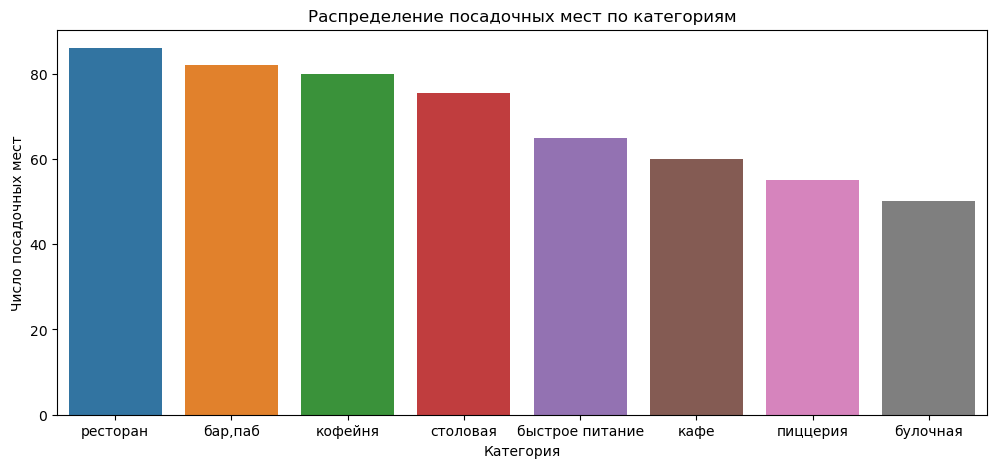

In [20]:
f, ax = plt.subplots(figsize=(12, 5))
ax = sns.barplot(x='category', y='seats', data=categoryGrouped)
ax.set(ylabel="Число посадочных мест", xlabel="Категория", title="Распределение посадочных мест по категориям")
plt.show()

Больше всего посадочных мест в ресторанах, барах, пабах и кофейнях. Меньше всего в пиццериях и булочных.

In [21]:
chain = places.groupby('category')['chain'].agg(['sum', 'count']).reset_index().sort_values(by='count', ascending=False)
chain['perc'] = chain['sum'] / chain['count']
chain.sort_values(by='perc', ascending=False)

,category,sum,count,perc
1,булочная,157,256,0.613281
5,пиццерия,330,633,0.521327
4,кофейня,720,1413,0.509554
2,быстрое питание,232,603,0.384743
6,ресторан,729,2042,0.357003
3,кафе,779,2376,0.327862
7,столовая,88,315,0.279365
0,"бар,паб",168,764,0.219895


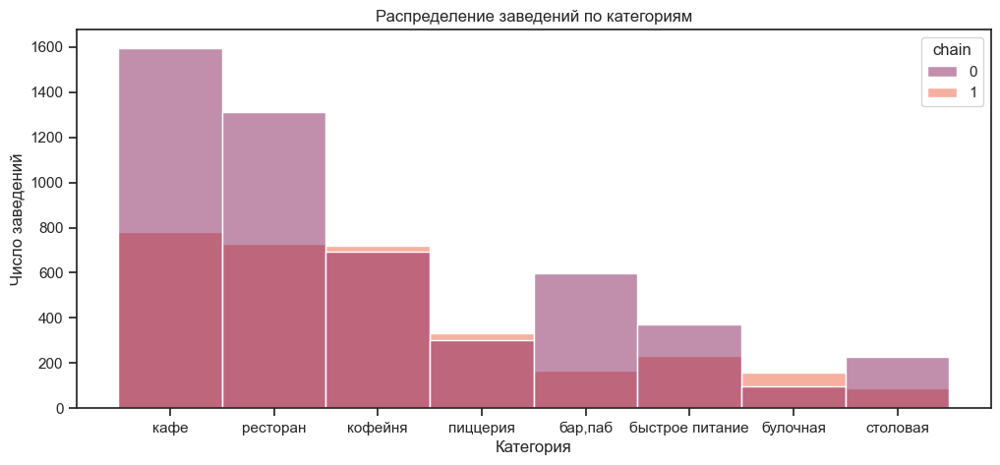

In [22]:
sns.set_theme(style="ticks")
f, ax = plt.subplots(figsize=(12, 5))
sns.histplot(places, x='category', hue='chain', palette="rocket")
ax.set(ylabel="Число заведений", xlabel="Категория", title="Распределение заведений по категориям")
plt.show()

In [23]:
round(places.loc[places['chain']==0, 'name'].count() / places.loc[places['chain']==1, 'name'].count(), 2)

1.62

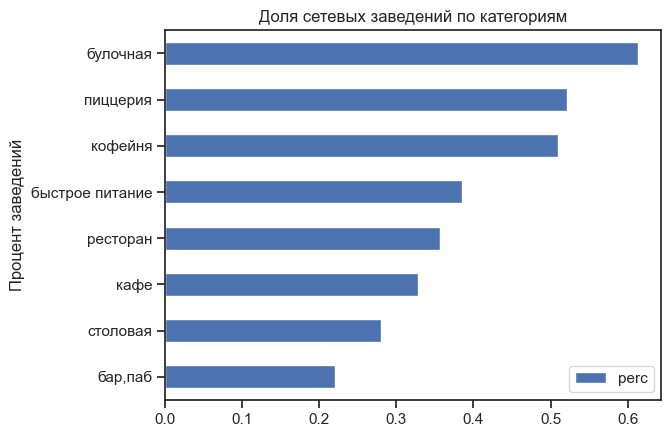

In [24]:
chain.sort_values('perc').plot(x='category',y='perc', kind='barh',
                              ylabel="Категория", xlabel="Процент заведений",
                              title="Доля сетевых заведений по категориям")
plt.show()

Число несетевых заведений более чем в полтора раза превышает количество сетевых. Исходя из графика кофейни пиццерии и булочные чаще являются сетевыми, чем заведения из других категорий.

In [25]:
chain_names = places.query('chain==1').groupby('name', as_index=False)[['category', 'address']].agg({'category': 'first', 'address': 'count'}).sort_values(by='address',ascending=False)
chain_names.columns = ['name', 'category', 'count']
chain_names.head(15)

,name,category,count
729,шоколадница,кофейня,120
335,домино'с пицца,пиццерия,76
331,додо пицца,пиццерия,74
146,one price coffee,кофейня,71
742,яндекс лавка,ресторан,69
58,cofix,кофейня,65
168,prime,ресторан,50
664,хинкальная,быстрое питание,44
409,кофепорт,кофейня,42
418,кулинарная лавка братьев караваевых,кафе,39


In [26]:
fig = px.bar(chain_names.head(15), x='name', y='count', hover_data=['category'],
             labels={'name':'Название заведений', 'count': 'Число заведений'},title='Топ-15 сетевых заведений')
fig.show()

Судя по графику, число кофейень Шоколадница превышает более чем в полтора раза количество заведений в других популярных сетях. Закрывает топ-15 сеть кафетериев Му-Му, у которой 27 точек.

In [27]:
district_category = places.pivot_table(index='district', columns='category', values='name', aggfunc='count').reset_index()
district_category.columns
district_category['всего'] = district_category['бар,паб'] + district_category['булочная']\
                   + district_category['быстрое питание'] + district_category['кафе']\
                   +district_category['кофейня'] + district_category['пиццерия']\
                   +district_category['ресторан'] + district_category['столовая']
district_category.sort_values(by='всего',ascending=False)

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242
2,Северный административный округ,68,39,58,234,193,77,188,41,898
8,Южный административный округ,68,25,85,264,131,73,202,44,892
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
1,Западный административный округ,50,37,62,238,150,71,218,24,850
0,Восточный административный округ,53,25,71,272,105,72,160,40,798
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


In [28]:
fig = px.histogram(places, y="district", color="category")\
    .update_yaxes(categoryorder='total ascending').update_layout(
    title={"text": "Распределение заведений по административным районам"},
    yaxis_title="", xaxis_title="Число заведений", font=dict(size=11)
)
fig.show()

Большая часть заведений, как в общем, так и в разбивке по категориям, находится в Центральном административном округе. Самым непопулярным по числу заведений можно выделить Северо-Западный административный округ.

In [29]:
category_rating = places.groupby('category', as_index=False)['rating'].mean().sort_values(by='rating',ascending=False)
category_rating

,category,rating
0,"бар,паб",4.387696
5,пиццерия,4.301264
6,ресторан,4.290402
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.124285
2,быстрое питание,4.050249


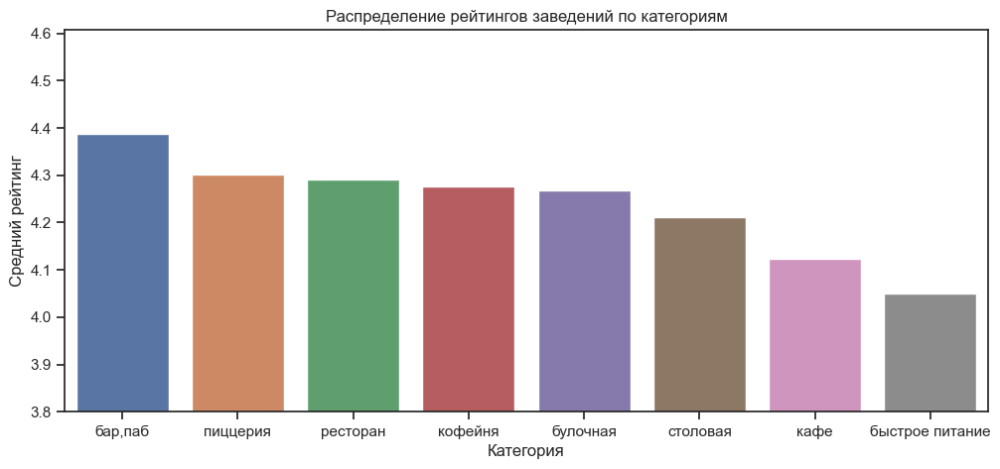

In [30]:
f, ax = plt.subplots(figsize=(12, 5))
ax = sns.barplot(x='category', y='rating', data=category_rating)
ax.set(ylim=(3.8, None), ylabel="Средний рейтинг", xlabel="Категория", title="Распределение рейтингов заведений по категориям")
plt.show()

Фаворитом по рейтингу среди категорий с небольшим отрывом можно выделить бары и пабы. Ниже всего рейтинги у ресторанов быстрого питания.

In [31]:
rating_df = places.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [32]:
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [33]:
district_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=district_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

In [34]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

In [35]:
top_streets = places.groupby('street', as_index=False)['name'].count().sort_values(by='name', ascending=False).head(15)
print(top_streets)
top_streets = top_streets['street']

                      street  name
781            проспект мира   183
785        профсоюзная улица   122
778     проспект вернадского   108
509       ленинский проспект   107
507   ленинградский проспект    95
361        дмитровское шоссе    88
442          каширское шоссе    77
291         варшавское шоссе    75
508      ленинградское шоссе    69
582                     мкад    65
528         люблинская улица    60
1012          улица вавилова    55
501     кутузовский проспект    54
1169    улица миклухо-маклая    49
792          пятницкая улица    48


In [36]:
fig = px.histogram(places.query('street.isin(@top_streets)'), y='street', color='category')\
    .update_yaxes(categoryorder='total ascending').update_layout(
    title={"text": "Распределение заведений по улицам"}, yaxis_title="", xaxis_title="Число заведений"
)
fig.show()

На проспекте Мира, Профсоюзной улице, проспекте Вернадского и Ленинском проспекте наибольшее число заведений общепита, и превышает отметку в сотню.

In [37]:
streets = places.groupby('street', as_index=False)['name'].count().query('name == 1')
streets = streets['street']
streets

0         1-й автозаводский проезд
1          1-й балтийский переулок
2            1-й варшавский проезд
3          1-й вешняковский проезд
5        1-й голутвинский переулок
                   ...            
1343            чонгарский бульвар
1356              шоссейный проезд
1360        электрический переулок
1369           якиманский переулок
1370    яковоапостольский переулок
Name: street, Length: 415, dtype: object

In [38]:
fig = px.histogram(places.query('street.isin(@streets)'), y="category",)\
    .update_yaxes(categoryorder='total ascending').update_layout(
    title={"text": "Одиночные заведения по категориям"}, yaxis_title="", xaxis_title="Число заведений"
)
fig.show()

Одиночные заведения на улицах Москвы распределены по категориям примерно в одинаковом соотношении - кафе, рестораны и кофейни все также являются самыми популярными категориями, а булочных меньше всего.

In [39]:
alone_places_df = places.query('street.isin(@streets)').groupby('district', as_index=False)['name']\
.agg('count').sort_values(by='name', ascending=False)
alone_places_df = alone_places_df.merge(places.groupby('district', as_index=False)['name']\
                                        .agg('count'), on='district', how='left')
alone_places_df.columns = ['district', 'alone', 'total']
alone_places_df['perc'] = alone_places_df['alone'] / alone_places_df['total']
alone_places_df

,district,alone,total,perc
0,Центральный административный округ,135,2242,0.060214
1,Северо-Восточный административный округ,49,890,0.055056
2,Восточный административный округ,48,798,0.060150
3,Северный административный округ,46,898,0.051225
4,Южный административный округ,36,892,0.040359
5,Западный административный округ,35,850,0.041176
6,Юго-Восточный административный округ,32,714,0.044818
7,Северо-Западный административный округ,18,409,0.044010
8,Юго-Западный административный округ,16,709,0.022567


In [40]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=district_geo,
    data=alone_places_df,
    columns=['district', 'perc'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Процент одиночных заведений по районам',
).add_to(m)

# выводим карту
m

In [41]:
plc1 = places.groupby('category', as_index=False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill', ascending=False)
plc2 = places.loc[places['street'].isin(streets)].groupby('category', as_index=False)['middle_avg_bill'].median().fillna(0)

fig = go.Figure()

fig.add_trace(go.Bar(x=plc1['category'], y=plc1['middle_avg_bill'], name='Total'))
fig.add_trace(go.Bar(x=plc2['category'], y=plc2['middle_avg_bill'], name='Stricted')).update_layout(
    title={"text": "Разница в средних чеках по категориям"}, yaxis_title="Средний чек", xaxis_title="Категория"
)
fig.show()

На улицах, где находится только один объект общепита, средний чек либо выше, либо на том же уровне, что и в других заведениях тех же категорий.

In [42]:
plc1 = places.groupby('district', as_index=False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill', ascending=False)
plc2 = places.loc[places['street'].isin(streets)].groupby('district', as_index=False)['middle_avg_bill'].median().fillna(0)

fig = go.Figure()

fig.add_trace(go.Bar(x=plc1['district'], y=plc1['middle_avg_bill'], name='Total'))
fig.add_trace(go.Bar(x=plc2['district'], y=plc2['middle_avg_bill'], name='Stricted')).update_layout(
    title={"text": "Разница в средних чеках по округам"}, yaxis_title="Средний чек", xaxis_title=""
)
fig.show()

В разбивке по областям ситуация обратная - во многих областях цены в одиночных заведениях ниже других заведений, и лишь в центральном округе цены идентичны, а в северо-западном и юго-восточном выше, чем в остальных заведениях.

На 415-и улицах города из датасета расположено всего по одному зданию общепита. Это может говорить о нахождении этих улиц в промышленных зонах/спальных районах/возле шоссе или связано с какой либо другой спецификой.

In [43]:
avg_bill_df = places.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill', ascending=False)
avg_bill_df

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [44]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=district_geo,
    data=avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# выводим карту
m

По результатам исследования можно сказать, что:
 1. В датасете информация о 7 типах заведений. Наибольшую популярность из них имеют кафе, рестораны и кофейни.
 2. Больше всего посадочных мест в ресторанах, барах, пабах и кофейнях. Меньше всего в пиццериях и булочных.
 3. Несетевых заведений более чем в полтора раза больше, чем сетевых. Кофейни пиццерии и булочные чаще являются сетевыми, чем заведения из других категорий.
 4. Самой крупной сетью питания Москвы является кофейня Шоколадница. На втором и третьем местах находятся соответственно пиццерии Домино и Додо пицца.
 5. Наибольшая часть заведений находится в центральной административной области Москвы.
 6. Лучшие показатели рейтингов у пабов и баров. Худшие показатели наблюдаются у кафе и ресторанов быстрого питания.
 7. Прямой зависимости между рейтингом заведения и районом, в котором оно находится, нет.
 8. В центральной и западной областях Москвы средний чек заведений выше, чем других областях.

## Детализируем исследование: открытие кофейни

In [45]:
print(places.loc[places['category'] == "кофейня", 'name'].count())
places.query('category == "кофейня"').groupby('district')['name'].count().sort_values(ascending=False)

1413


district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: name, dtype: int64

In [46]:
coffee = (
places.query('category=="кофейня" & chain==1').pivot_table(index='district', values='name', aggfunc='count').reset_index()\
.merge(places.query('category=="кофейня" & chain==0').pivot_table(index='district', values='name', aggfunc='count')\
       .reset_index(), on='district')\
.merge(places.query('category=="кофейня"').pivot_table(index='district', values='name', aggfunc='count')\
       .reset_index(), on='district')\
.merge(places.query('category=="кофейня"').pivot_table(index='district', values='middle_coffee_cup', aggfunc='median')\
       .reset_index(), on='district')
)
coffee.columns = ['область', 'сетевые', 'несетевые', 'всего', 'средний чек']
coffee.sort_values(by='средний чек', ascending=False)

,область,сетевые,несетевые,всего,средний чек
7,Юго-Западный административный округ,50,46,96,198.0
5,Центральный административный округ,221,207,428,190.0
1,Западный административный округ,93,57,150,189.0
4,Северо-Западный административный округ,34,28,62,165.0
3,Северо-Восточный административный округ,79,80,159,162.5
2,Северный административный округ,97,96,193,159.0
8,Южный административный округ,66,65,131,150.0
6,Юго-Восточный административный округ,29,60,89,147.5
0,Восточный административный округ,51,54,105,135.0


In [47]:
print(places.loc[np.logical_and(places['category']=="кофейня", places['is_24/7']==True),'name'].count(), 'кофеень в датасете круглосуточные')
print(round(places.loc[np.logical_and(places['category']=="кофейня", places['is_24/7']==True),'name'].count()\
     /places.loc[places['category']=="кофейня",'name'].count() * 100, 2), 'процент круглосуточных кофеень')

59 кофеень в датасете круглосуточные
4.18 процент круглосуточных кофеень


In [48]:
districtRating = places.query('category=="кофейня"').groupby('district', as_index=False)\
['rating'].mean().sort_values(by='rating', ascending=False)
districtRating

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


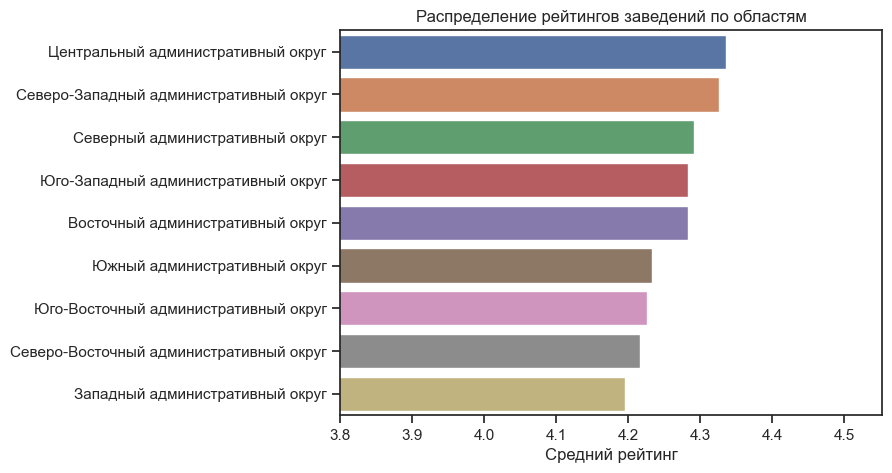

In [49]:
f, ax = plt.subplots(figsize=(7, 5))
ax = sns.barplot(x='rating', y='district', data=districtRating)
ax.set(xlim=(3.8, None), xlabel="Средний рейтинг", ylabel="", title="Распределение рейтингов заведений по областям")
plt.show()

Как и с рейтингами по всем категориям, среди кофеен в разных районах Москвы рейтинги приблизительно одинаковы. Стоит также заметить, что медиана рейтингов в западном округе Москвы ниже других округов.

In [50]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']} {row['chain']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.query('category=="кофейня"').apply(create_clusters, axis=1)

# выводим карту
m

В выборе точки для новой кофейни стоит отдать предпочтение западному округу Москвы, поскольку кофеен в этом районе не так много, как в других популярных районах, а средний чек одной чашки капучино 189 рублей, что является одним из самых высоких показателей среди кофеень. При открытии, стоит расчитывать на цены в заведении ниже среднего по району на 10-15%, чтобы получить конкурентное преимущество и как можно скорее создать базу постоянных клиентов.

## Выводы

В ходе исследовательского анализа датасета с заведениями общественного питания Москвы на этапе предобработки была выявлена потеря большой части данных о средних чеках и средней цене за чашку капучино, что могло негативно сказаться на дальнейших результатах исследования. Дубликатов не было обнаружено, а аномалии были успешно обработаны.

Проведя исследовательский анализ данных, было обнаружено, что:
 1. Кофейни занимают третье место среди числа заведений Москвы по категориям.
 2. Большая часть кофеень находится в центральном округе, остальные равномерно распределены между другими крупными районами Москвы.
 3. Средний рейтинг кофеень западной части Москвы ниже остальных округов.
 4. Средний чек в заведениях центральной и западной частях Москвы заметно выше, чем в других округах.

Исходя из фактов выше, наилучшим районом для открытия собственной кофейни будет западный административный округ, поскольку конкуренция в этом районе низкая, рейтинг заведений ниже других районов, что говорит о возможном низком качестве обслуживания, а показатель среднего чека один из самых высоких среди районов Москвы.

Презентация по результатам исследования - https://docs.google.com/presentation/d/1Qwwn3fospVbtX8iz9xDZkeyf09bhYOmy-4iEPqfC7vc/edit?usp=sharing